In [12]:
import torch
import numpy as np
import pandas as pd
import seaborn
from ast import literal_eval

In [3]:
cd ..

c:\Users\Tanner\Documents\repos\ironmarch-archetypal


In [27]:
embedding_data = pd.read_csv('saved_embeddings\\train_sinkhorn_vae_2021-08-12_19-45-38\\train_sinkhorn_vae_c774e2cc_6_one=0.94555,zero=0.8_2021-08-12_19-45-38\checkpoint_000040\embeddings.csv')
embedding_data = np.array([np.array(literal_eval(embedding)) for _, embedding in embedding_data.to_numpy()])


embedding_distances = np.power(
        np.sum(
            np.power(
                np.abs(embedding_data - (1 / embedding_data.shape[1]))
            , 2.0)
        , axis = 1)
    , 0.5)

In [32]:
dirichlet_distribution = torch.distributions.dirichlet.Dirichlet(torch.tensor([1.0 for i in range(embedding_data.shape[1])]))
dirichlet_data = dirichlet_distribution.sample([1000000]).numpy()

dirichlet_distances = np.power(
        np.sum(
            np.power(
                np.abs(dirichlet_data - (1 / embedding_data.shape[1]))
            , 2.0)
        , axis = 1)
    , 0.5)

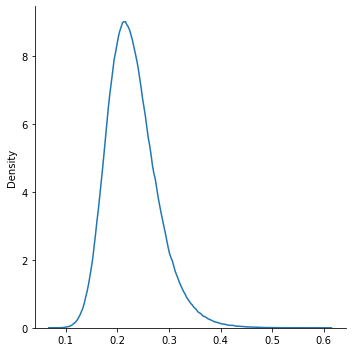

In [33]:
seaborn.displot(dirichlet_distances, kind = 'kde', bw_adjust = 0.5)

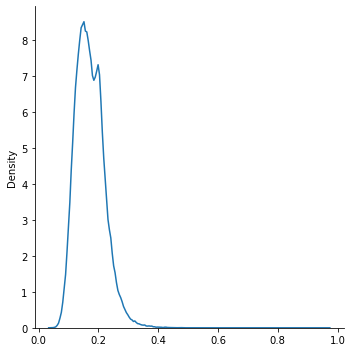

In [28]:
seaborn.displot(embedding_distances, kind = 'kde', bw_adjust = 0.5)

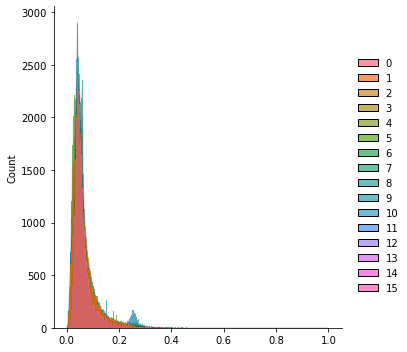

In [29]:
seaborn.displot(embedding_data)

In [43]:
point = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]])
point_distance = np.power(
        np.sum(
            np.power(
                np.abs(point - (1 / embedding_data.shape[1]))
            , 2.0)
        , axis = 1)
    , 0.5)

In [44]:
point_distance

array([0.96824584])